# Local Model Agnostic Interpretation Methods

In [ ]:
import re

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import nltk
from nltk.probability import FreqDist

from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn import svm
from sklearn.feature_extraction.text import TfidfVectorizer
import lightgbm as lgb

import shap
import lime
import lime.lime_tabular
from lime.lime_text import LimeTextExplainer
import machine_learning_datasets as mldatasets

In [2]:
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package stopwords to /home/keren/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/keren/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In this notebook we will look closer on the local interpretation methods, which explain why a single prediction or a group of predictions was made by the model. It will cover how to leverage SHAP Kerenl Explainer and LIME for local interpretation.

## Load Data

In [3]:
chocolateratings_df = mldatasets.load("chocolate-bar-ratings")
chocolateratings_df.head()

https://github.com/PacktPublishing/Interpretable-Machine-Learning-with-Python/raw/master/datasets/chocolate-ratings.zip downloaded to /home/keren/Interpretable-ML/notebooks/data/chocolate-ratings.zip
/home/keren/Interpretable-ML/notebooks/data/chocolate-ratings.zip uncompressed to /home/keren/Interpretable-ML/notebooks/data/chocolate-ratings
1 dataset files found in /home/keren/Interpretable-ML/notebooks/data/chocolate-ratings folder
parsing /home/keren/Interpretable-ML/notebooks/data/chocolate-ratings/chocolate.csv


,company,company_location,review_date,country_of_bean_origin,cocoa_percent,rating,counts_of_ingredients,beans,cocoa_butter,vanilla,lecithin,salt,sugar,sweetener_without_sugar,first_taste,second_taste,third_taste,fourth_taste
0,5150,U.S.A,2019,Madagascar,76.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,cocoa,blackberry,full body,NaN
1,5150,U.S.A,2019,Dominican republic,76.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,cocoa,vegetal,savory,NaN
2,5150,U.S.A,2019,Tanzania,76.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,rich cocoa,fatty,bready,NaN
3,A. Morin,France,2012,Peru,63.0,3.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,fruity,melon,roasty,NaN
4,A. Morin,France,2012,Bolivia,70.0,3.50,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,vegetal,nutty,NaN,NaN


## Data Preperation

In [4]:
tastes_df = chocolateratings_df[['first_taste', 'second_taste', 'third_taste', 'fourth_taste']]
chocolateratings_df = chocolateratings_df.drop(['first_taste', 'second_taste', 'third_taste', 'fourth_taste'], axis=1)
tastes_df.head(90).tail(10)

,first_taste,second_taste,third_taste,fourth_taste
80,oily,vegetal,nutty,cocoa
81,oily,vanilla,melon,cocoa
82,rich,sour,mild smoke,NaN
83,fruity,sour,NaN,NaN
84,high roast,high astringnet,NaN,NaN
85,smokey,savory,NaN,NaN
86,sandy,roasty,nutty,NaN
87,roasty,brownie,nutty,NaN
88,red wine,rich cocoa,long,NaN
89,creamy,fruit,cocoa,NaN


In [5]:
chocolateratings_df = mldatasets.make_dummies_with_limits(chocolateratings_df,\
                                        'company_location', 0.03333)
chocolateratings_df = mldatasets.make_dummies_with_limits(chocolateratings_df,\
                                        'country_of_bean_origin', 0.03333)

In [6]:
chocolateratings_df = chocolateratings_df.drop(['beans'], axis=1)

binary_features = ['cocoa_butter', 'vanilla', 'lecithin', 'salt',\
                   'sugar', 'sweetener_without_sugar']

chocolateratings_df[binary_features] =\
    chocolateratings_df[binary_features].\
        apply(lambda x: np.where(x.str.contains('_not_'), 0, 1))

In [7]:
stop = stopwords.words('english')

In [8]:
trans_dict = {'?':'', '&':'', 'overly intense':'intensest',\
              'overly sweet':'sweetest', 'overly tart':'tartest',\
              'sl. bitter':'bitterness', 'sl. burnt':'burntness',\
              'sl. sweet':'sweetness', 'sl. dry':'dryness',\
              'sl. chalky':'chalkiness', 'sl. Burnt':'burntness',\
              'hints fruit':'fruitiness', 'hint fruit':'fruitiness',\
              'high acid':'acidic', 'high acidity':'acidic',\
              'moderate acidity':'acid', 'high roast':'roast',\
              'astringcy':'astringent', 'astringnet':'astringent',\
              'full body':'robust', 'astringency':'astringent',\
              'high astringent':'acidic', 'rich cocoa':'rich',\
              'mild bitter':'bitterish', 'fruit long':'fruit',\
              'base cocoa':'basic', 'basic cocoa':'basic', '-like':'',\
              'smomkey':'smokey', 'true':'real', '(n)':'', '/':' ',\
              '-':' ', ' +':' ' }
trans_regex = re.compile("|".join(map(re.escape, trans_dict.keys( ))))

In [9]:
tastes_s = tastes_df.replace(np.nan, '', regex=True).\
            agg(' '.join, axis=1).str.strip().str.lower().\
            apply(lambda s: trans_regex.sub(lambda match:\
                                trans_dict[match.group(0)], s)).\
            apply(lambda s: ' '.join([word for word in s.split()\
                                      if word not in (stop)]))

In [10]:
print(tastes_s)

0          cocoa blackberry robust
1             cocoa vegetal savory
2                rich fatty bready
3              fruity melon roasty
4                    vegetal nutty
                   ...            
2219          waxy cloying vegetal
2220      strong nutty marshmallow
2221       muted roasty accessible
2222    fatty mild nuts mild fruit
2223            fatty earthy cocoa
Length: 2224, dtype: object


In [11]:
print(np.unique(tastes_s).shape)

(2178,)


In [12]:
tastewords_fdist = FreqDist(word for word in\
                            word_tokenize(tastes_s.str.cat(sep=' ')))
tastewords_df = pd.DataFrame.from_dict(tastewords_fdist,\
                                       orient='index').\
                                rename(columns={0:'freq'})
commontastes_l = tastewords_df[tastewords_df.freq > 74].index.to_list()
print(commontastes_l)

['cocoa', 'rich', 'fatty', 'roasty', 'nutty', 'sweet', 'sandy', 'sour', 'intense', 'mild', 'fruit', 'sticky', 'earthy', 'spice', 'molasses', 'floral', 'spicy', 'woody', 'coffee', 'berry', 'vanilla', 'creamy']


In [13]:
chocolateratings_df['tastes'] = tastes_s
chocolateratings_df = mldatasets.make_dummies_from_dict(chocolateratings_df,\
                                             'tastes', commontastes_l)

In [14]:
chocolateratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 46 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   company                                    2224 non-null   object 
 1   review_date                                2224 non-null   int64  
 2   cocoa_percent                              2224 non-null   float64
 3   rating                                     2224 non-null   float64
 4   counts_of_ingredients                      2224 non-null   int64  
 5   cocoa_butter                               2224 non-null   int64  
 6   vanilla                                    2224 non-null   int64  
 7   lecithin                                   2224 non-null   int64  
 8   salt                                       2224 non-null   int64  
 9   sugar                                      2224 non-null   int64  
 10  sweetener_without_sugar 

Train test split

In [15]:
rand = 9
y = chocolateratings_df['rating'].\
                            apply(lambda x: 1 if x >= 3.5 else 0)
X = chocolateratings_df.drop(['rating','company'], axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(X, y,\
                                test_size=0.33, random_state=rand)

In [16]:
X_train_nlp = tastes_s[X_train.index]
X_test_nlp = tastes_s[X_test.index]

## SVM Classifier

The fist model whihc will be sued is a Support Vector Classifier, to assess its prediction we need to set `probability` param to True to obtain probabilities from the model (at default SVM doesn't return probabilities, but in scikit learn we can obtin it by using cross-validation and fits logistic regression on it).

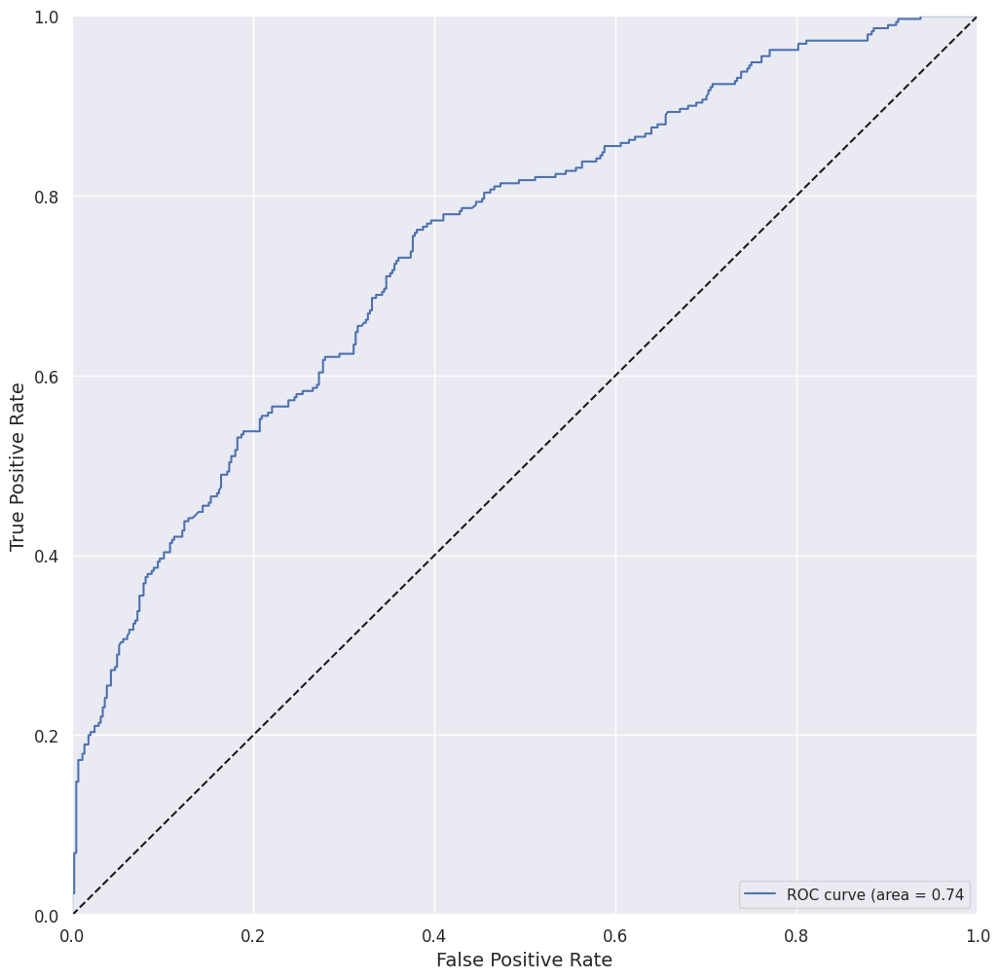

Accuracy_train:  0.7315		Accuracy_test:   0.6989
Precision_test:  0.6845		Recall_test:     0.4414
ROC-AUC_test:    0.7450		F1_test:         0.5367		MCC_test: 0.3461


In [17]:
orig_plt_params = plt.rcParams
sns.set_theme()
svm_mdl = svm.SVC(probability=True, gamma='auto', random_state=rand)
fitted_svm_mdl = svm_mdl.fit(X_train, y_train)
y_train_svc_pred, y_test_svc_prob, y_test_svc_pred =\
        mldatasets.evaluate_class_mdl(fitted_svm_mdl, X_train,\
                                      X_test, y_train, y_test)

### Computing SHAP values using Kernel Explainer

Kernel Explainer takes a predict function for a model and some training data. Once we have initialized explainer, we can use samples of our test data to come up with the SHAP values. To minimize computation it is using k-means to summarize the background training data instead of using it whole.

In [18]:
np.random.seed(rand)
X_train_summary = shap.kmeans(X_train, 10)
shap_svm_explainer = shap.KernelExplainer(fitted_svm_mdl.predict_proba,\
                                          X_train_summary)
shap_svm_values_test = shap_svm_explainer.shap_values(X_test,\
                                nsamples=200, l1_reg="num_features(20)")

  0%|          | 0/734 [00:00<?, ?it/s]

Global summary plot

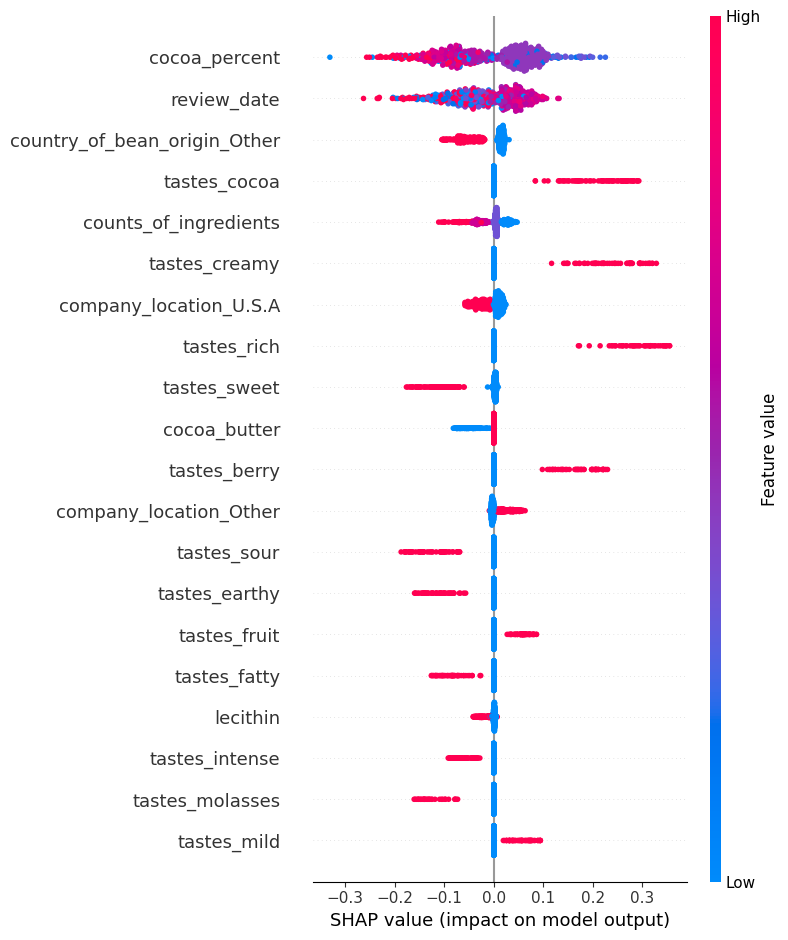

In [19]:
sns.reset_orig()
plt.rcParams.update(orig_plt_params)
shap.summary_plot(shap_svm_values_test[1], X_test, plot_type="dot")

Conclusions:

* highest (red) cocoa percentages tend to correlate with a decrease in the likelihood of Highly class, but middle values tend to increase it,
* review_date suggests that it was likely to be Highly in earlier years,
* cocoa, rich, creamy and berry tastes increase likelihood for Highly class,
* sour, earthy, fatty, intense and molasses tastes decrease likelihood for Highly class,
* manufacturing in USA decrease probability of Highly class.

### Local Interpretation for a group of predictions using Decision Plots

In [20]:
sample_test_idx = X_test.index.get_indexer_for([5,6,7,18,19,21,24,25,27])

One of the SHAP property is additivity. If you add all SHAP values from a one prediction you will get actual predicted value.

In [21]:
expected_value = shap_svm_explainer.expected_value[1]
y_test_shap_pred = (shap_svm_values_test[1].sum(1) + expected_value) > 0.5
print(np.array_equal(y_test_shap_pred, y_test_svc_pred))

True


Store false negative predictions

In [24]:
FN = (~y_test_shap_pred[sample_test_idx]) &\
     (y_test.iloc[sample_test_idx] == 1).to_numpy() 

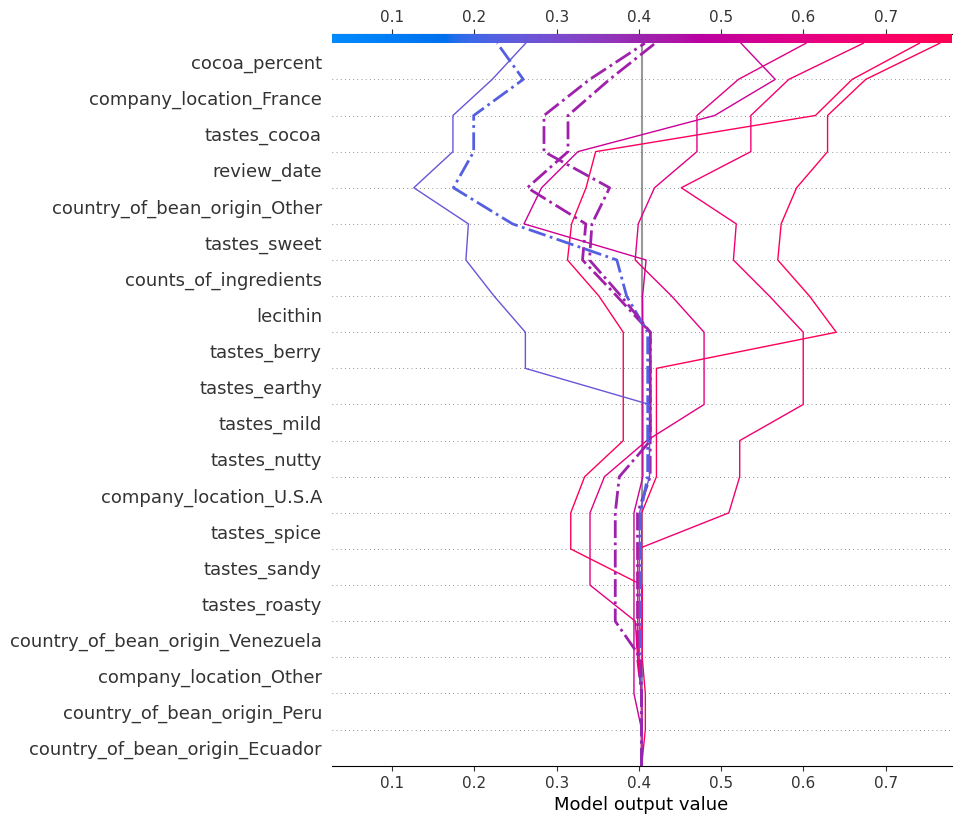

In [25]:
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx],\
                   X_test.iloc[sample_test_idx], highlight=FN)

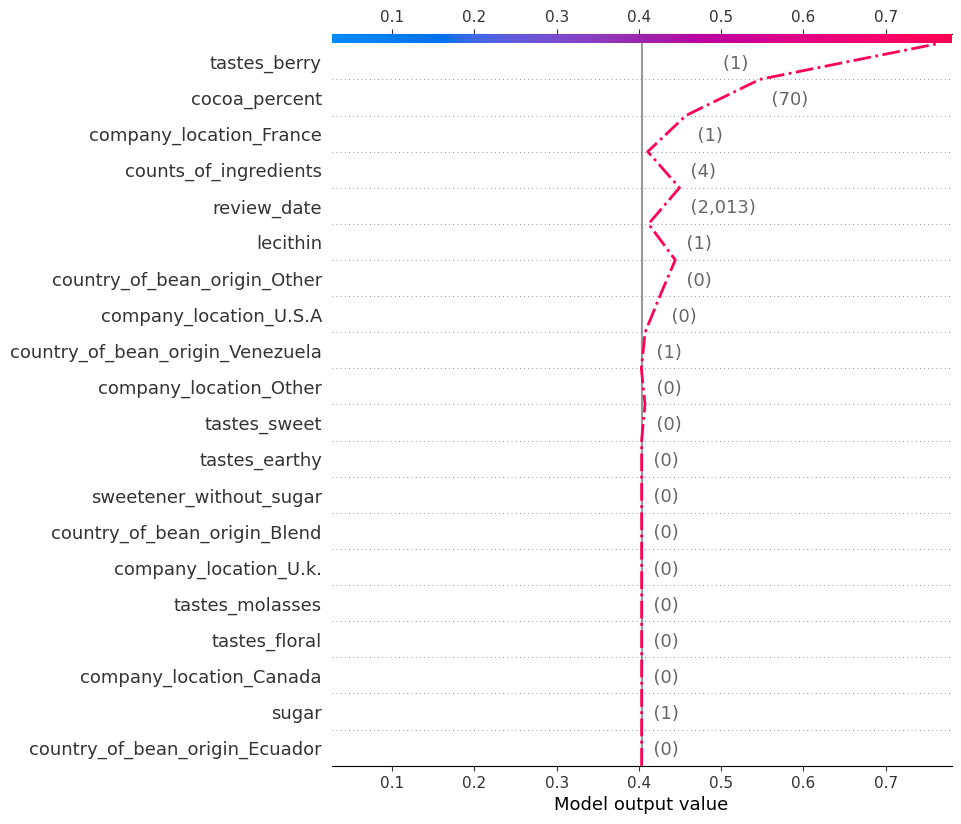

In [26]:
shap.decision_plot(expected_value, shap_svm_values_test[1][696],\
                   X_test.iloc[696], highlight=0)

### Local Interpretation for a single prediction at a time using Force Plot

If we want to investigate the diffrences between two given examples we can use force plot for each of them. It depicts how much each feature weigh in prediction.

In [27]:
pd.set_option('display.precision', 0)
eval_idxs = X_test.index.isin([5,24])
X_test_eval = X_test[eval_idxs]
eval_compare_df = pd.concat([\
            chocolateratings_df.iloc[X_test[eval_idxs].index].rating,\
            pd.DataFrame({'y':y_test[eval_idxs]}, index=[5,24]),\
            pd.DataFrame({'y_pred':y_test_svc_pred[eval_idxs]},\
                         index=[24,5]),
            X_test_eval], axis=1).transpose()
eval_compare_df

,24,5
rating,3,4
y,0,1
y_pred,0,1
review_date,2015,2013
cocoa_percent,70,70
counts_of_ingredients,4,4
cocoa_butter,1,1
vanilla,0,0
lecithin,1,1
salt,0,0


In [28]:
shap.initjs()
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==5],\
                X_test[X_test.index==5])

In [29]:
shap.initjs()
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==24],\
                X_test[X_test.index==24])

## Employing Local Interpretable Model-agnostic Explanations (LIME)

The idea behind the [LIME](https://christophm.github.io/interpretable-ml-book/lime.html) is quite intuitive. First, forget about the training data and imagine you only have the black box model where you can input data points and get the predictions of the model. Your goal is to understand why the machine learning model made a certain prediction. LIME tests what happens to the predictions when you give variations of your data into the machine learning model. LIME generates a new dataset consisting of perturbed samples and the corresponding predictions of the black box model. On this new dataset LIME then trains an interpretable model, which is weighted by the proximity of the sampled instances to the instance of interest. The interpretable model can for example be Lasso or a decision tree. The learned model should be a good approximation of the machine learning model predictions locally, but it does not have to be a good global approximation. This kind of accuracy is also called local fidelity.

The recipe for training local surrogate models:

* Select your instance of interest for which you want to have an explanation of its black box prediction.
* Perturb your dataset and get the black box predictions for these new points.
* Weight the new samples according to their proximity to the instance of interest.
* Train a weighted, interpretable model on the dataset with the variations.
* Explain the prediction by interpreting the local model.

### Local Interpretation for a single prediction at a time using LimeTabularExplainer

LIME samples are not taken around the instance of interest, but from the training data’s mass center, which is problematic. But it increases the probability that the result for some of the sample points predictions differ from the data point of interest and that LIME can learn at least some explanation.

In [30]:
lime_svm_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,\
                        feature_names=X_test.columns, categorical_features=list(range(3,44)),\
                        class_names=['Not Highly Recomm.', 'Highly Recomm.'])

In [31]:
lime_svm_explainer.explain_instance(X_test[X_test.index==5].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

X does not have valid feature names, but SVC was fitted with feature names


In [32]:
lime_svm_explainer.explain_instance(X_test[X_test.index==24].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

X does not have valid feature names, but SVC was fitted with feature names


### Using LIME for Natural Language Processing

In [33]:
print(X_test_nlp)

1194                 roasty nutty rich
77      roasty oddly sweet marshmallow
121              balanced cherry choco
411                sweet floral yogurt
1259           creamy burnt nuts woody
                     ...              
327          sweet mild molasses bland
1832          intense fruity mild sour
464              roasty sour milk note
2013           nutty fruit sour floral
1190           rich roasty nutty smoke
Length: 734, dtype: object


In [34]:
vectorizer = TfidfVectorizer(lowercase=False)
X_train_nlp_fit = vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit = vectorizer.transform(X_test_nlp)

In [35]:
pd.set_option('display.precision', 6)
pd.DataFrame({'taste':vectorizer.get_feature_names_out(),\
              'tf-idf': np.asarray(X_test_nlp_fit[X_test_nlp.index==5].todense())[0]}).\
    sort_values(by='tf-idf', ascending=False).\
head(5)

,taste,tf-idf
305,raspberry,0.585538
259,nut,0.491542
265,oily,0.463973
64,caramel,0.447504
274,papaya,0.000000


#### Train LightGBM Model

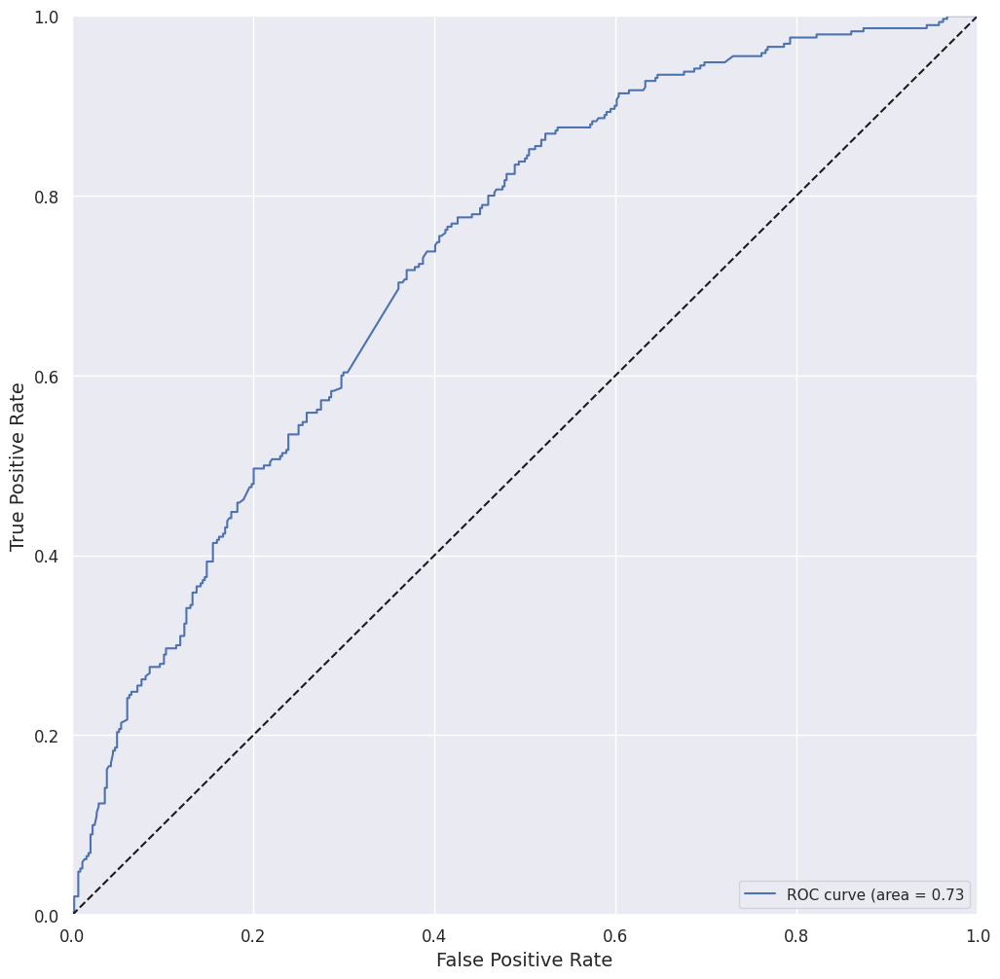

Accuracy_train:  0.7980		Accuracy_test:   0.6744
Precision_test:  0.6123		Recall_test:     0.4793
ROC-AUC_test:    0.7300		F1_test:         0.5377		MCC_test: 0.2973


In [37]:
sns.set_theme()
lgb_mdl = lgb.LGBMClassifier(max_depth=13, learning_rate=0.05,\
            n_estimators=100, objective='binary', verbose=-1, force_row_wise=True,\
            random_state=rand)
fitted_lgb_mdl = lgb_mdl.fit(X_train_nlp_fit, y_train)
y_train_lgb_pred, y_test_lgb_prob, y_test_lgb_pred =\
    mldatasets.evaluate_class_mdl(fitted_lgb_mdl, X_train_nlp_fit,\
                                  X_test_nlp_fit, y_train, y_test)

### Local Interpretation for a single prediction at a time using LimeTextExplainer

LIME for text differs from LIME for tabular data. Variations of the data are generated differently: Starting from the original text, new texts are created by randomly removing words from the original text. The dataset is represented with binary features for each word.

In [38]:
lgb_pipeline = make_pipeline(vectorizer, lgb_mdl)

In [39]:
lime_lgb_explainer = LimeTextExplainer(class_names=['Not Highly Recomm.', 'Highly Recomm.'])

In [40]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==5].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [41]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==24].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [42]:
lime_lgb_explainer.explain_instance('creamy rich complex fruity',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('sour bitter roasty molasses',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('nasty disgusting gross stuff',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

### Trying SHAP for Natural Language Processing

In [43]:
predict_fn = lambda X: lgb_mdl.predict_proba(X)[:,1]

  0%|          | 0/100 [00:00<?, ?it/s]

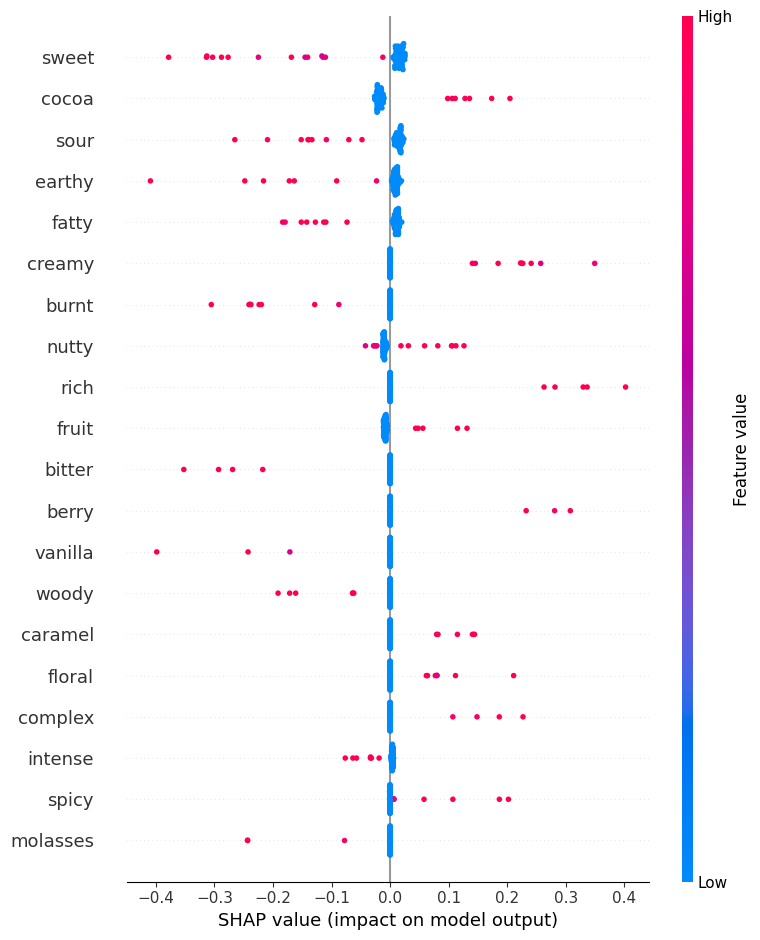

In [44]:
sns.reset_orig()
plt.rcParams.update(orig_plt_params)
X_test_nlp_samp_df = pd.DataFrame(X_test_nlp_fit[:100].todense())
shap_lgb_explainer = shap.KernelExplainer(predict_fn,\
                            shap.kmeans(X_train_nlp_fit.toarray(), 10))
shap_lgb_values_test = shap_lgb_explainer.shap_values(X_test_nlp_samp_df,\
                                            l1_reg="num_features(20)")
shap.summary_plot(shap_lgb_values_test, X_test_nlp_samp_df,\
            plot_type="dot", feature_names=vectorizer.get_feature_names_out())

In [45]:
#Location was 18 but it's better to use the index to find the current location
pos = X_test_nlp.index.get_loc(1002)

print(X_test_nlp.to_list()[pos])

woody earthy medicinal


In [46]:
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[pos,:],
                X_test_nlp_samp_df.iloc[pos,:], feature_names=vectorizer.get_feature_names_out())

In [47]:
#Location was 9 but it's better to use the index to find the current location
pos = X_test_nlp.index.get_loc(1583)

print(X_test_nlp.to_list()[pos])

intense spicy floral


In [48]:
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[pos,:],
                X_test_nlp_samp_df.iloc[pos,:], feature_names=vectorizer.get_feature_names_out())